In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as pe
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_auc_score, roc_curve, accuracy_score
from sklearn.preprocessing import binarize
import warnings
from sklearn.preprocessing import LabelEncoder

warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (20, 15)
plt.rcParams['figure.dpi'] = 350
sns.set_style(style='darkgrid')
plt.tight_layout()

<Figure size 7000x5250 with 0 Axes>

In [2]:
df = pd.read_csv("D:/bank-full.csv",sep=";")
df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [3]:
df_nrow = df.shape[0]


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [5]:
df.describe().astype(np.int64)

,age,balance,day,duration,campaign,pdays,previous
count,45211,45211,45211,45211,45211,45211,45211
mean,40,1362,15,258,2,40,0
std,10,3044,8,257,3,100,2
min,18,-8019,1,0,1,-1,0
25%,33,72,8,103,1,-1,0
50%,39,448,16,180,2,-1,0
75%,48,1428,21,319,3,-1,0
max,95,102127,31,4918,63,871,275


In [6]:
df.isna().sum()


age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

In [7]:
def uni(df):

    for i in range(len(df.columns)):
        print('\n All Unique Value in ' + str(df.columns[i]))
        print(np.sort(df[df.columns[i]].unique()))
        print('Total no of unique values ' +
              str(len(df[df.columns[i]].unique())))

In [8]:
uni(df)


 All Unique Value in age
[18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41
 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65
 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89
 90 92 93 94 95]
Total no of unique values 77

 All Unique Value in job
['admin.' 'blue-collar' 'entrepreneur' 'housemaid' 'management' 'retired'
 'self-employed' 'services' 'student' 'technician' 'unemployed' 'unknown']
Total no of unique values 12

 All Unique Value in marital
['divorced' 'married' 'single']
Total no of unique values 3

 All Unique Value in education
['primary' 'secondary' 'tertiary' 'unknown']
Total no of unique values 4

 All Unique Value in default
['no' 'yes']
Total no of unique values 2

 All Unique Value in balance
[ -8019  -6847  -4057 ...  81204  98417 102127]
Total no of unique values 7168

 All Unique Value in housing
['no' 'yes']
Total no of unique values 2

 All Unique Value in loan
['no' 'yes']
Total no of unique 

In [9]:
df[df.duplicated()]


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y


there is no duplicate value in the dataset

<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

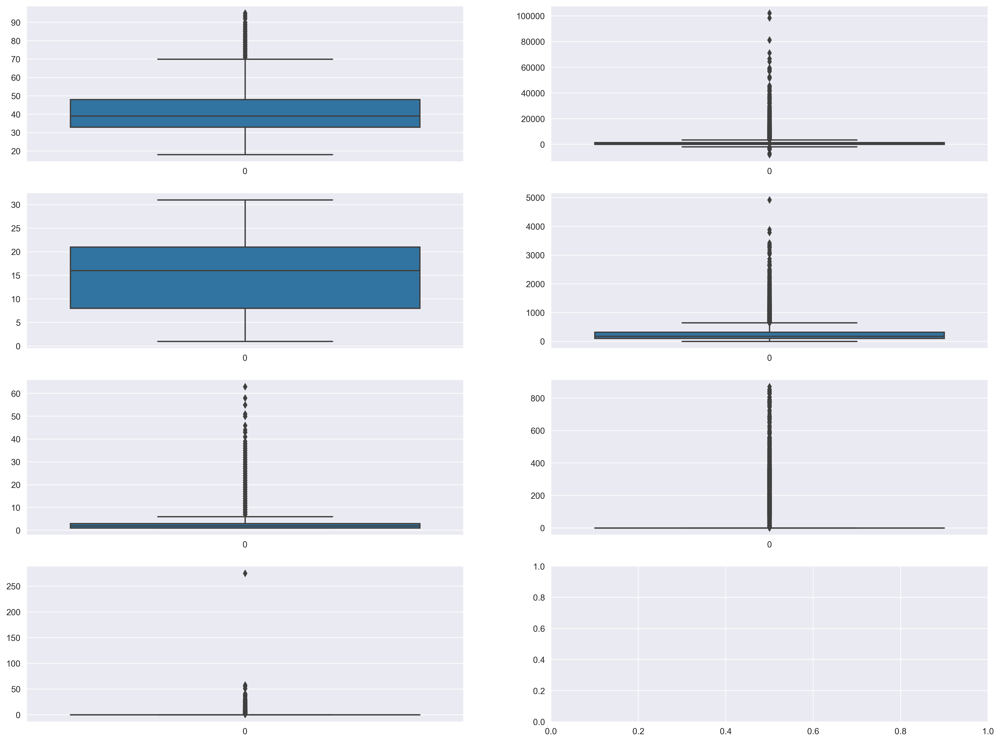

In [10]:
fig, ax = plt.subplots(4, 2)

sns.boxplot(df['age'], ax=ax[0, 0])
sns.boxplot(df['balance'], ax=ax[0, 1])
sns.boxplot(df['day'], ax=ax[1, 0])
sns.boxplot(df['duration'], ax=ax[1, 1])
sns.boxplot(df['campaign'], ax=ax[2, 0])
sns.boxplot(df['pdays'], ax=ax[2, 1])
sns.boxplot(df['previous'], ax=ax[3, 0])

plt.tight_layout

<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

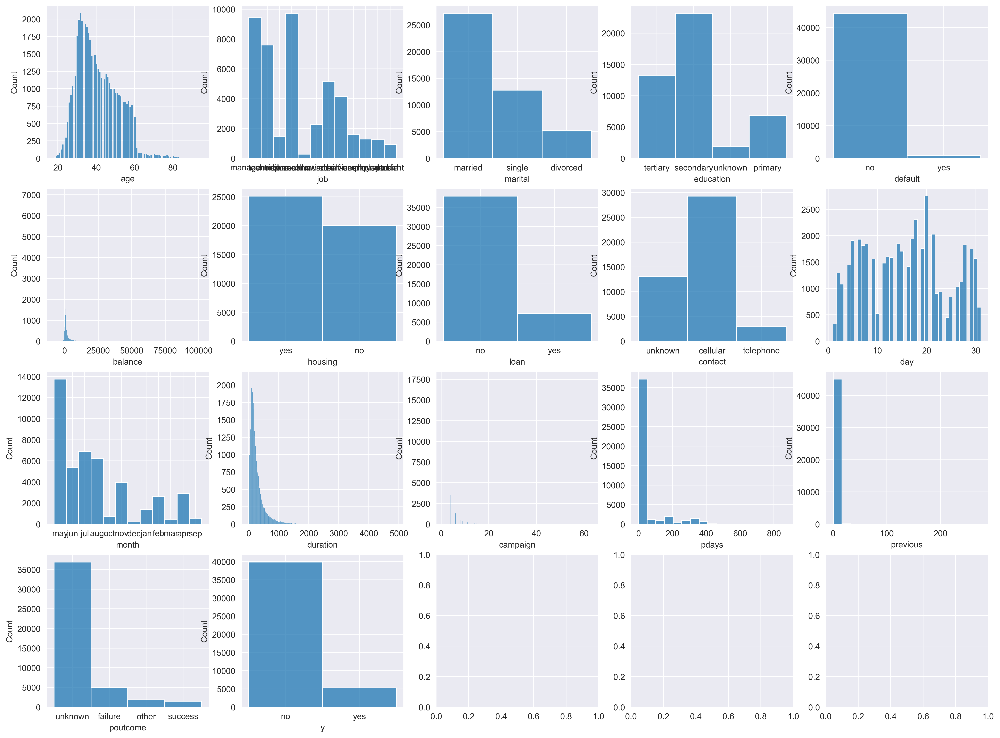

In [11]:
fig, ax = plt.subplots(4, 5)

sns.histplot(df['age'], ax=ax[0, 0])
sns.histplot(df['job'], ax=ax[0, 1])
sns.histplot(df['marital'], ax=ax[0, 2])
sns.histplot(df['education'], ax=ax[0, 3])
sns.histplot(df['default'], ax=ax[0, 4])
sns.histplot(df['balance'], ax=ax[1, 0])
sns.histplot(df['housing'], ax=ax[1, 1])
sns.histplot(df['loan'], ax=ax[1, 2])
sns.histplot(df['contact'], ax=ax[1, 3])
sns.histplot(df['day'], ax=ax[1, 4])
sns.histplot(df['month'], ax=ax[2, 0])
sns.histplot(df['duration'], ax=ax[2, 1])
sns.histplot(df['campaign'], ax=ax[2, 2])
sns.histplot(df['pdays'], ax=ax[2, 3])
sns.histplot(df['previous'], ax=ax[2, 4])
sns.histplot(df['poutcome'], ax=ax[3, 0])
sns.histplot(df['y'], ax=ax[3, 1])
plt.tight_layout


<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

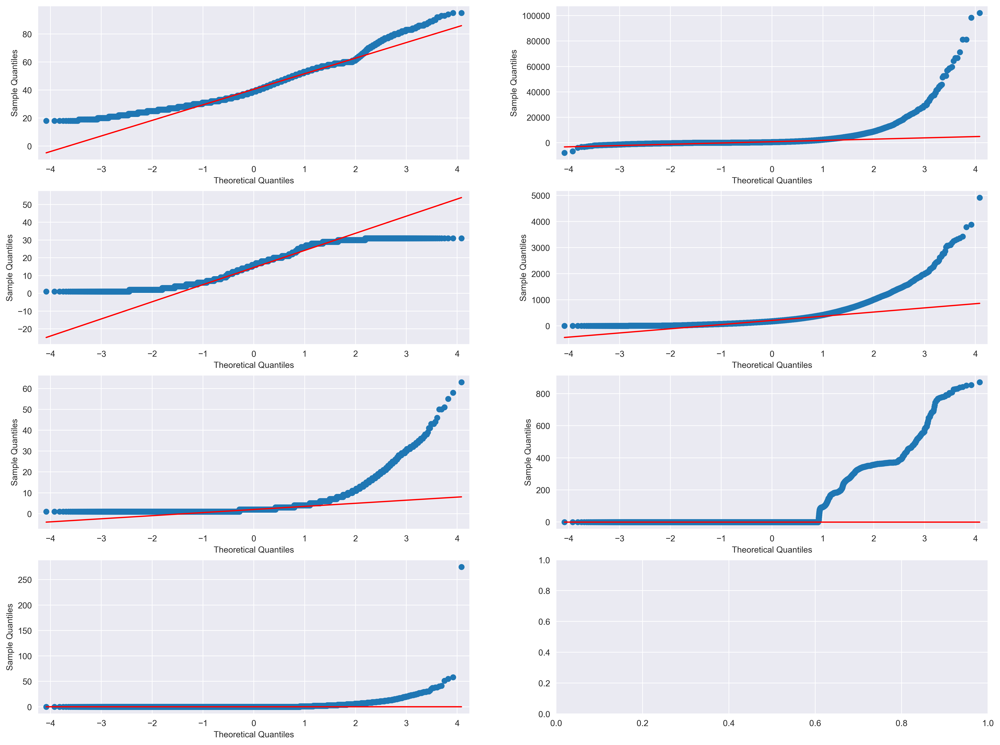

In [12]:
fig, ax = plt.subplots(4, 2)

sm.qqplot(df['age'], ax=ax[0, 0], line='q')
sm.qqplot(df['balance'], ax=ax[0, 1], line='q')
sm.qqplot(df['day'], ax=ax[1, 0], line='q')
sm.qqplot(df['duration'], ax=ax[1, 1], line='q')
sm.qqplot(df['campaign'], ax=ax[2, 0], line='q')
sm.qqplot(df['pdays'], ax=ax[2, 1], line='q')
sm.qqplot(df['previous'], ax=ax[3, 0], line='q')

plt.tight_layout

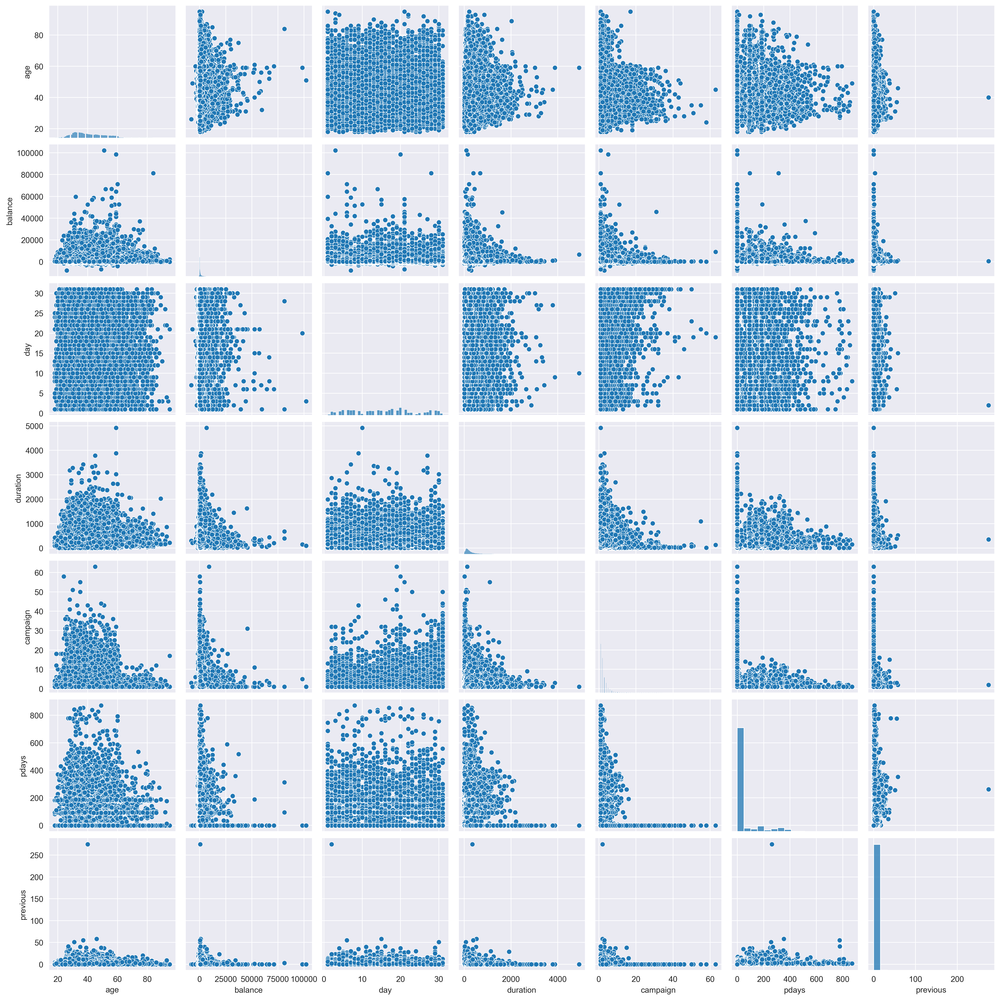

In [13]:
sns.pairplot(data=df)

<Axes: >

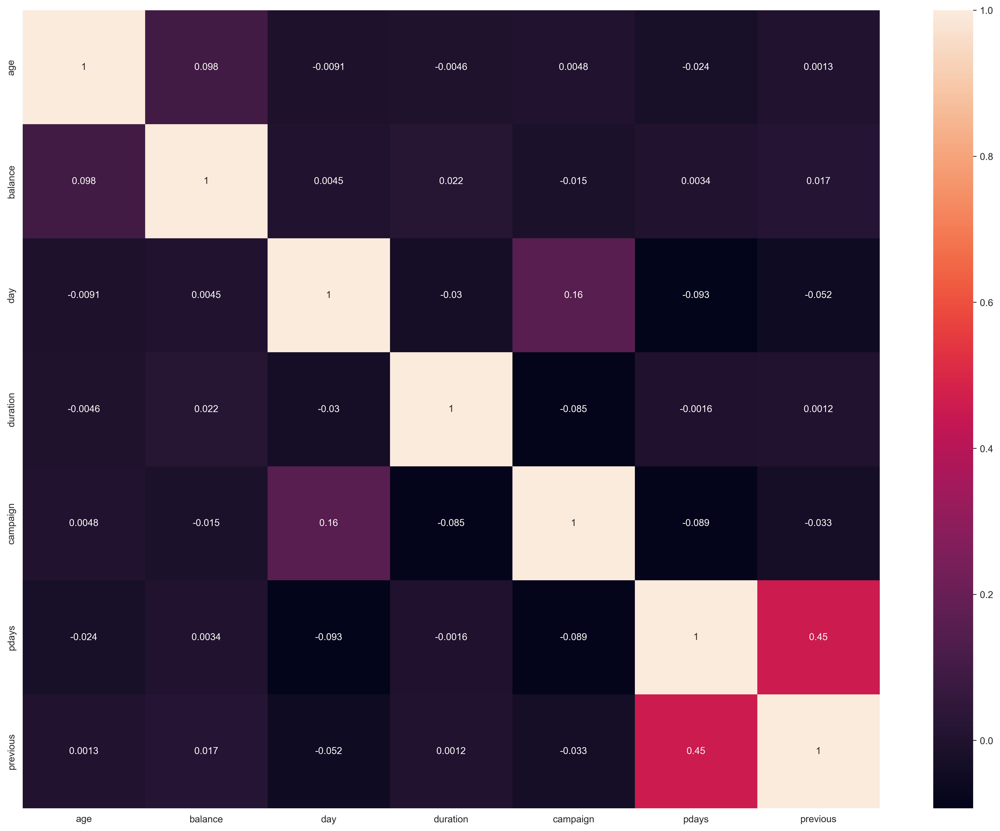

In [14]:
sns.heatmap(df.corr(), annot=True)

In [15]:
labelencoder = LabelEncoder()
df.iloc[:,1] = labelencoder.fit_transform(df.iloc[:,1])
df.iloc[:,2] = labelencoder.fit_transform(df.iloc[:,2])
df.iloc[:,3] = labelencoder.fit_transform(df.iloc[:,3])
df.iloc[:,4] = labelencoder.fit_transform(df.iloc[:,4])
df.iloc[:,6] = labelencoder.fit_transform(df.iloc[:,6])
df.iloc[:,7] = labelencoder.fit_transform(df.iloc[:,7])
df.iloc[:,8] = labelencoder.fit_transform(df.iloc[:,8])
df.iloc[:,10] = labelencoder.fit_transform(df.iloc[:,10])
df.iloc[:,15] = labelencoder.fit_transform(df.iloc[:,15])
df.iloc[:,16] = labelencoder.fit_transform(df.iloc[:,16])

In [16]:
df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,4,1,2,0,2143,1,0,2,5,8,261,1,-1,0,3,0
1,44,9,2,1,0,29,1,0,2,5,8,151,1,-1,0,3,0
2,33,2,1,1,0,2,1,1,2,5,8,76,1,-1,0,3,0
3,47,1,1,3,0,1506,1,0,2,5,8,92,1,-1,0,3,0
4,33,11,2,3,0,1,0,0,2,5,8,198,1,-1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,9,1,2,0,825,0,0,0,17,9,977,3,-1,0,3,1
45207,71,5,0,0,0,1729,0,0,0,17,9,456,2,-1,0,3,1
45208,72,5,1,1,0,5715,0,0,0,17,9,1127,5,184,3,2,1
45209,57,1,1,1,0,668,0,0,1,17,9,508,4,-1,0,3,0


In [17]:
def outlier_percentage(df):
    for i in range(len(df.columns)):

        q1 = df[df.columns[i]].quantile(0.25)
        q3 = df[df.columns[i]].quantile(0.75)
        iqr = q3-q1

        upper = q3 + (iqr*1.5)
        lower = q1 - (iqr*1.5)

        percentage = (((len(df[df[df.columns[i]] > upper])) +
                      (len(df[df[df.columns[i]] < lower])))/len(df[df.columns[i]]))*100

        print(str(df.columns[i]) + ' : ' + str(percentage) + ' %')

In [18]:
def replace_outlier_extream(st, col):

    q1 = st[col].quantile(0.25)
    q3 = st[col].quantile(0.75)
    iqr = q3-q1

    upper = q3 + (iqr*1.5)
    lower = q1 - (iqr*1.5)

    st[col].mask(st[col] > upper, upper, inplace=True)
    st[col].mask(st[col] < lower, lower, inplace=True)

In [19]:
def remove_outlier(st, col):
    q1 = st[col].quantile(0.25)
    q3 = st[col].quantile(0.75)
    iqr = q3-q1

    upper = q3 + (iqr*1.5)
    lower = q1 - (iqr*1.5)

    st = st[(st[col] > lower) & (st[col] < upper)]

    return st


outlier percentage(before)

In [20]:
outlier_percentage(df)

age : 1.0771714848156422 %
job : 0.0 %
marital : 0.0 %
education : 0.0 %
default : 1.8026586450200173 %
balance : 10.459843843312468 %
housing : 0.0 %
loan : 16.022649355245406 %
contact : 0.0 %
day : 0.0 %
month : 0.0 %
duration : 7.155338302625467 %
campaign : 6.7771117648359915 %
pdays : 18.263254517705867 %
previous : 18.263254517705867 %
poutcome : 18.252195262214947 %
y : 11.698480458295547 %


we cannot remove outlier in the categorical columns and also from campaign ,pdays & previous,because this columns cant be properly evaluated.

# Removing Outlier in age column

In [21]:
pe.box(df['age'],orientation='h')

# OUTLIER PERCENTAGE (After)

In [22]:
outlier_percentage(df)

age : 1.0771714848156422 %
job : 0.0 %
marital : 0.0 %
education : 0.0 %
default : 1.8026586450200173 %
balance : 10.459843843312468 %
housing : 0.0 %
loan : 16.022649355245406 %
contact : 0.0 %
day : 0.0 %
month : 0.0 %
duration : 7.155338302625467 %
campaign : 6.7771117648359915 %
pdays : 18.263254517705867 %
previous : 18.263254517705867 %
poutcome : 18.252195262214947 %
y : 11.698480458295547 %


In [23]:
df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,4,1,2,0,2143,1,0,2,5,8,261,1,-1,0,3,0
1,44,9,2,1,0,29,1,0,2,5,8,151,1,-1,0,3,0
2,33,2,1,1,0,2,1,1,2,5,8,76,1,-1,0,3,0
3,47,1,1,3,0,1506,1,0,2,5,8,92,1,-1,0,3,0
4,33,11,2,3,0,1,0,0,2,5,8,198,1,-1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,9,1,2,0,825,0,0,0,17,9,977,3,-1,0,3,1
45207,71,5,0,0,0,1729,0,0,0,17,9,456,2,-1,0,3,1
45208,72,5,1,1,0,5715,0,0,0,17,9,1127,5,184,3,2,1
45209,57,1,1,1,0,668,0,0,1,17,9,508,4,-1,0,3,0


In [24]:
df.reset_index(inplace=True)
df.drop(columns='index', inplace=True)

df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,4,1,2,0,2143,1,0,2,5,8,261,1,-1,0,3,0
1,44,9,2,1,0,29,1,0,2,5,8,151,1,-1,0,3,0
2,33,2,1,1,0,2,1,1,2,5,8,76,1,-1,0,3,0
3,47,1,1,3,0,1506,1,0,2,5,8,92,1,-1,0,3,0
4,33,11,2,3,0,1,0,0,2,5,8,198,1,-1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,9,1,2,0,825,0,0,0,17,9,977,3,-1,0,3,1
45207,71,5,0,0,0,1729,0,0,0,17,9,456,2,-1,0,3,1
45208,72,5,1,1,0,5715,0,0,0,17,9,1127,5,184,3,2,1
45209,57,1,1,1,0,668,0,0,1,17,9,508,4,-1,0,3,0


# Splitting The Data Into Target and Independent set

In [25]:
x = df.iloc[:,:-1]
y = df['y']

In [26]:
x

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,58,4,1,2,0,2143,1,0,2,5,8,261,1,-1,0,3
1,44,9,2,1,0,29,1,0,2,5,8,151,1,-1,0,3
2,33,2,1,1,0,2,1,1,2,5,8,76,1,-1,0,3
3,47,1,1,3,0,1506,1,0,2,5,8,92,1,-1,0,3
4,33,11,2,3,0,1,0,0,2,5,8,198,1,-1,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,9,1,2,0,825,0,0,0,17,9,977,3,-1,0,3
45207,71,5,0,0,0,1729,0,0,0,17,9,456,2,-1,0,3
45208,72,5,1,1,0,5715,0,0,0,17,9,1127,5,184,3,2
45209,57,1,1,1,0,668,0,0,1,17,9,508,4,-1,0,3


# Normalizing the Dataset

In [27]:
sc = StandardScaler()
scaled_x  = pd.DataFrame(sc.fit_transform(x), columns=x.columns)


In [28]:
scaled_x

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,1.606965,-0.103820,-0.275762,1.036362,-0.13549,0.256419,0.893915,-0.436803,1.514306,-1.298476,0.823773,0.011016,-0.569351,-0.411453,-0.251940,0.444898
1,0.288529,1.424008,1.368372,-0.300556,-0.13549,-0.437895,0.893915,-0.436803,1.514306,-1.298476,0.823773,-0.416127,-0.569351,-0.411453,-0.251940,0.444898
2,-0.747384,-0.714951,-0.275762,-0.300556,-0.13549,-0.446762,0.893915,2.289359,1.514306,-1.298476,0.823773,-0.707361,-0.569351,-0.411453,-0.251940,0.444898
3,0.571051,-1.020516,-0.275762,2.373280,-0.13549,0.047205,0.893915,-0.436803,1.514306,-1.298476,0.823773,-0.645231,-0.569351,-0.411453,-0.251940,0.444898
4,-0.747384,2.035139,1.368372,2.373280,-0.13549,-0.447091,-1.118674,-0.436803,1.514306,-1.298476,0.823773,-0.233620,-0.569351,-0.411453,-0.251940,0.444898
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,0.947747,1.424008,-0.275762,1.036362,-0.13549,-0.176460,-1.118674,-0.436803,-0.713012,0.143418,1.156344,2.791329,0.076230,-0.411453,-0.251940,0.444898
45207,2.831227,0.201746,-1.919895,-1.637474,-0.13549,0.120447,-1.118674,-0.436803,-0.713012,0.143418,1.156344,0.768224,-0.246560,-0.411453,-0.251940,0.444898
45208,2.925401,0.201746,-0.275762,-0.300556,-0.13549,1.429593,-1.118674,-0.436803,-0.713012,0.143418,1.156344,3.373797,0.721811,1.436189,1.050473,-0.566175
45209,1.512791,-1.020516,-0.275762,-0.300556,-0.13549,-0.228024,-1.118674,-0.436803,0.400647,0.143418,1.156344,0.970146,0.399020,-0.411453,-0.251940,0.444898


# Splitting the DAta into Training and Testing Set

In [29]:
xtrain,xtest,ytrain,ytest = train_test_split(scaled_x,y,train_size=0.75,random_state=1)

In [30]:
xtrain

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
32731,-1.124080,-1.020516,-0.275762,-0.300556,-0.13549,-0.402424,0.893915,-0.436803,-0.713012,0.143418,-1.836794,0.329432,-0.246560,2.754506,1.050473,-1.577248
1498,-0.182341,-1.020516,-0.275762,-1.637474,-0.13549,-0.174817,0.893915,-0.436803,1.514306,-0.938003,0.823773,-0.047231,-0.246560,-0.411453,-0.251940,0.444898
17532,-1.029906,1.424008,-0.275762,1.036362,-0.13549,-0.085154,0.893915,2.289359,-0.713012,1.585313,-0.173939,-0.427776,3.949713,-0.411453,-0.251940,0.444898
8166,-1.500776,0.812877,1.368372,-0.300556,-0.13549,-0.372207,0.893915,-0.436803,1.514306,-1.658950,0.158632,-0.171490,-0.246560,-0.411453,-0.251940,0.444898
15495,-0.841558,-0.103820,-0.275762,-0.300556,-0.13549,0.491251,0.893915,2.289359,-0.713012,0.263576,-0.173939,-0.043348,0.721811,-0.411453,-0.251940,0.444898
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43723,0.853573,1.424008,-0.275762,1.036362,-0.13549,0.153619,-1.118674,-0.436803,-0.713012,-0.217055,0.823773,0.232354,0.076230,-0.411453,-0.251940,0.444898
32511,-0.653211,-0.103820,-1.919895,1.036362,-0.13549,-0.274005,0.893915,-0.436803,-0.713012,0.143418,-1.836794,-0.097711,-0.246560,-0.411453,-0.251940,0.444898
5192,0.665225,-0.103820,-0.275762,1.036362,-0.13549,0.929056,-1.118674,-0.436803,1.514306,0.624050,0.823773,0.407094,1.044601,-0.411453,-0.251940,0.444898
12172,0.382703,-1.326082,-0.275762,2.373280,-0.13549,0.138182,-1.118674,-0.436803,1.514306,0.503892,0.158632,-0.959764,2.658552,-0.411453,-0.251940,0.444898


# Preparing Model from the Dataset

In [31]:
lg= LogisticRegression()

# Training the Model

In [32]:
lg.fit(xtrain,ytrain)

LogisticRegression()

In [33]:
ypred= lg.predict(xtest)

In [34]:
ypred[:21]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

# Evaluating the model

Creating Classification Report

In [35]:
print('Actual Y:',ytest[:25].values)
print("oredict Y:",ypred[:25])

Actual Y: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
oredict Y: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]


In [36]:
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

           0       0.91      0.98      0.94      9998
           1       0.58      0.22      0.32      1305

    accuracy                           0.89     11303
   macro avg       0.74      0.60      0.63     11303
weighted avg       0.87      0.89      0.87     11303



we have accuracy of 89% which is fine but are recall value is very low we need to increase it as per our problem statemnet

# Preparing Confusion Matrix

In [37]:
confusion_matrix(ytest,ypred)

array([[9794,  204],
       [1022,  283]], dtype=int64)

Text(776.5277777777777, 0.5, 'Predicted Values')

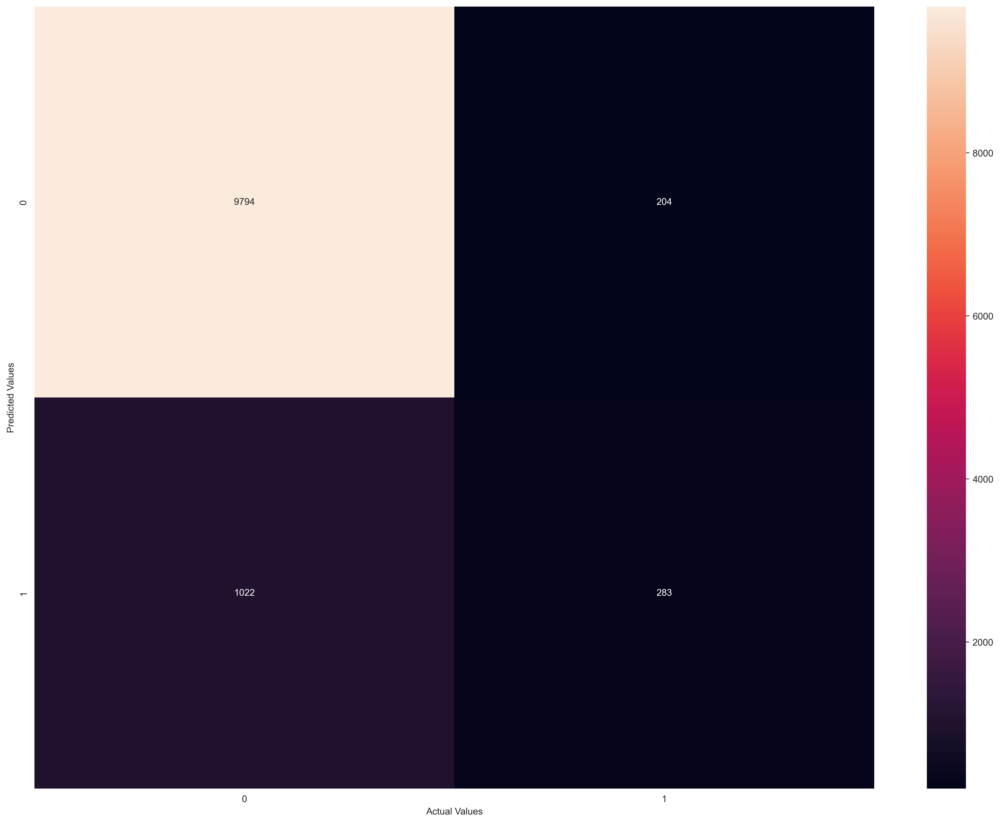

In [38]:
sns.heatmap(confusion_matrix(ytest,ypred), annot = True, fmt='.4g')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')


# Performing Threshold Selection

# Shorting all Probability for Threshold Selection  

In [39]:
lg.predict_proba(xtest)

array([[0.98663204, 0.01336796],
       [0.96421484, 0.03578516],
       [0.74676889, 0.25323111],
       ...,
       [0.75415949, 0.24584051],
       [0.17896601, 0.82103399],
       [0.98501993, 0.01498007]])

In [40]:
proba = lg.predict_proba(xtest)[:,1]

proba

array([0.01336796, 0.03578516, 0.25323111, ..., 0.24584051, 0.82103399,
       0.01498007])

# plotting the Roc curve 


In [41]:
auc = roc_auc_score(ytest, proba)

In [42]:
auc

0.8710614919918849

In [43]:
fpr,tpr, threshold = roc_curve(ytest,proba)

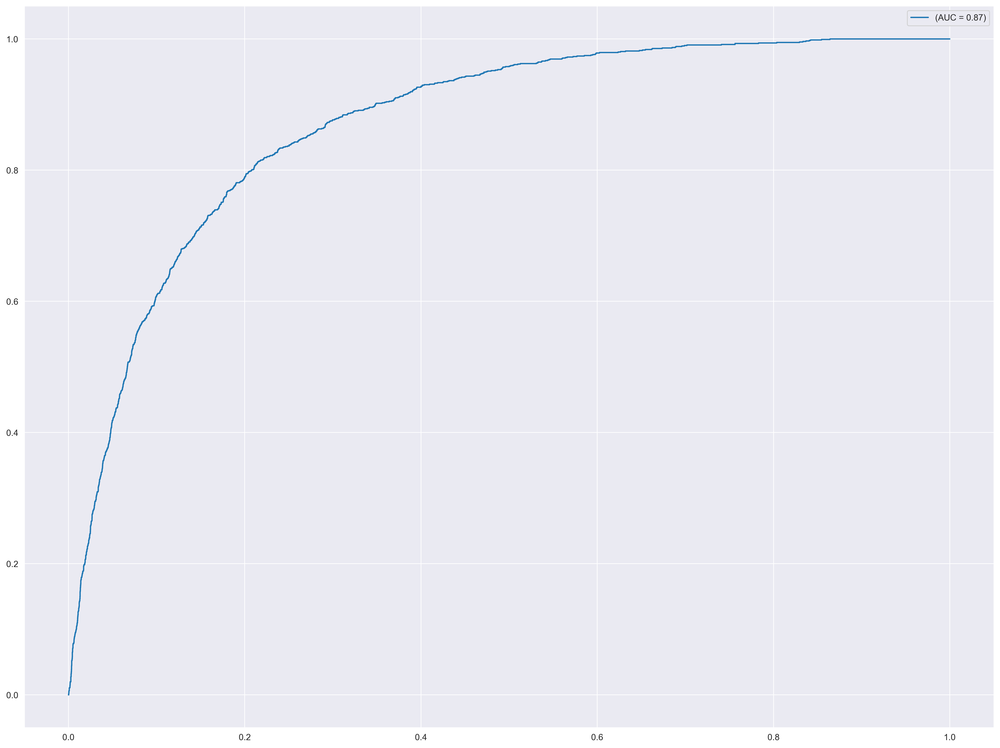

In [44]:
plt.plot(fpr,tpr,label= '(AUC = %0.2f)'%auc)
plt.legend()

# Selecting Optimal Threshold Value

In [45]:
def Optimal_Threshold(proba,ytest,ypred):
    accuracy = []

    for i in threshold:
        ypred = np.where(proba>i,1,0)
        accuracy.append(accuracy_score(ytest,ypred))

        final_threshold = pd.concat([pd.Series(threshold),pd.Series(accuracy)], axis=1)
        final_threshold.columns = ['Threshold','Accuracy']

        threshold_value = final_threshold.sort_values(by='Accuracy', ascending=False).iloc[0,0]
    
    return threshold_value,final_threshold.sort_values(by='Accuracy', ascending=False)


In [46]:
Optimal_Threshold(proba,ytest,ypred)

(0.42752962020494745,
       Threshold  Accuracy
 287    0.427530  0.892506
 288    0.427341  0.892506
 289    0.426011  0.892418
 295    0.422573  0.892329
 292    0.423530  0.892329
 ...         ...       ...
 1722   0.013213  0.244094
 1723   0.013212  0.244006
 1724   0.012694  0.235690
 1725   0.012688  0.235601
 1726   0.000058  0.115545
 
 [1727 rows x 2 columns])

# Fiting Optimal Threshold In The Model

In [47]:
new_ypred = binarize([proba], threshold = Optimal_Threshold(proba,ytest,ypred)[0])[0]

new_ypred

array([0., 0., 0., ..., 0., 1., 0.])

we have created new predection with are new threshold

# Preparing Classification Report With New Threshold

In [48]:
print(classification_report(ytest,new_ypred))

              precision    recall  f1-score   support

           0       0.91      0.97      0.94      9998
           1       0.57      0.27      0.37      1305

    accuracy                           0.89     11303
   macro avg       0.74      0.62      0.66     11303
weighted avg       0.87      0.89      0.88     11303

